#### The tutorial and dataset used here have been adapted from DIPY:

- #### This demo presents the fiber to bundle coherence (FBC) quantitative measure of the alignment of each fiber with the surrounding fiber bundles. These measures are useful in ‘cleaning’ the results of tractography algorithms, since low FBCs indicate which fibers are isolated and poorly aligned with their neighbors.

- #### Here we implement FBC measures based on kernel density estimation in the non-flat 5D position-orientation domain. First we compute the kernel density estimator induced by the full lifted output (defined in the space of positions and orientations) of the tractography. Then, the Local FBC (LFBC) is the result of evaluating the estimator along each element of the lifted fiber. A whole fiber measure, the relative FBC (RFBC), is calculated by the minimum of the moving average LFBC along the fiber. Details of the computation of FBC can be found in:
[J. Portegies, R. Fick, G. Sanguinetti, S. Meesters, G.Girard, and R. Duits. (2015) Improving Fiber Alignment in HARDI by Combining Contextual PDE flow with Constrained Spherical Deconvolution. PLoS One.].

- #### The FBC measures are evaluated on the Stanford HARDI dataset (150 orientations, b=2000s/mm^2) which is one of the standard example datasets in DIPY.

In [1]:
interactive = True

import numpy as np
from dipy.core.gradients import gradient_table
from dipy.data import get_fnames
from dipy.io.image import load_nifti_data, load_nifti
from dipy.io.gradients import read_bvals_bvecs

# Fix seed
np.random.seed(1)

# Read data
hardi_fname, hardi_bval_fname, hardi_bvec_fname = get_fnames('stanford_hardi')
label_fname = get_fnames('stanford_labels')
t1_fname = get_fnames('stanford_t1')

data, affine = load_nifti(hardi_fname)
labels = load_nifti_data(label_fname)
t1_data = load_nifti_data(t1_fname)
bvals, bvecs = read_bvals_bvecs(hardi_bval_fname, hardi_bvec_fname)
gtab = gradient_table(bvals, bvecs)

# Select a relevant part of the data (left hemisphere)
# Coordinates given in x bounds, y bounds, z bounds
dshape = data.shape[:-1]
xa, xb, ya, yb, za, zb = [15, 42, 10, 65, 18, 65]
data_small = data[xa:xb, ya:yb, za:zb]
selectionmask = np.zeros(dshape, 'bool')
selectionmask[xa:xb, ya:yb, za:zb] = True

#### The data is first fitted to Constant Solid Angle (CDA) ODF Model. CSA is a good choice to estimate general fractional anisotropy (GFA), which the stopping criterion can use to restrict fiber tracking to those areas where the ODF shows significant restricted diffusion, thus creating a region-of-interest in which the computations are done.

In [2]:
# Perform CSA
from dipy.reconst.shm import CsaOdfModel
from dipy.data import default_sphere
from dipy.direction import peaks_from_model

csa_model = CsaOdfModel(gtab, sh_order=6)
csa_peaks = peaks_from_model(csa_model, data, default_sphere,
                             relative_peak_threshold=.6,
                             min_separation_angle=45,
                             mask=selectionmask)

# Stopping Criterion
from dipy.tracking.stopping_criterion import ThresholdStoppingCriterion

stopping_criterion = ThresholdStoppingCriterion(csa_peaks.gfa, 0.25)

#### In order to perform probabilistic fiber tracking we first fit the data to the Constrained Spherical Deconvolution (CSD) model in DIPY. This model represents each voxel in the data set as a collection of small white matter fibers with different orientations. The density of fibers along each orientation is known as the Fiber Orientation Distribution (FOD), used in the fiber tracking.

In [3]:
# Perform CSD on the original data
from dipy.reconst.csdeconv import auto_response
from dipy.reconst.csdeconv import ConstrainedSphericalDeconvModel

response, ratio = auto_response(gtab, data, roi_radius=10, fa_thr=0.7)
csd_model = ConstrainedSphericalDeconvModel(gtab, response)
csd_fit = csd_model.fit(data_small)
csd_fit_shm = np.lib.pad(csd_fit.shm_coeff, ((xa, dshape[0]-xb),
                                             (ya, dshape[1]-yb),
                                             (za, dshape[2]-zb),
                                             (0, 0)), 'constant')

# Probabilistic direction getting for fiber tracking
from dipy.direction import ProbabilisticDirectionGetter

prob_dg = ProbabilisticDirectionGetter.from_shcoeff(csd_fit_shm,
                                                    max_angle=30.,
                                                    sphere=default_sphere)

#### The optic radiation is reconstructed by tracking fibers from the calcarine sulcus (visual cortex: V1) to the lateral geniculate nucleus (LGN). We seed from the calcarine sulcus by selecting a region-of-interest (ROI) cube of dimensions 3x3x3 voxels.

In [4]:
# Set a seed region region for tractography.
from dipy.tracking import utils

mask = np.zeros(data.shape[:-1], 'bool')
rad = 3
mask[26-rad:26+rad, 29-rad:29+rad, 31-rad:31+rad] = True
seeds = utils.seeds_from_mask(mask, affine, density=[6, 6, 6])

#### Local Tracking is used for probabilistic tractography which takes the direction getter along with the stopping criterion and seeds as input.

In [5]:
# Perform tracking using Local Tracking
from dipy.tracking.local_tracking import LocalTracking

streamlines_generator = LocalTracking(prob_dg, stopping_criterion, seeds,
                                      affine, step_size=.5)

# Compute streamlines.
from dipy.tracking.streamline import Streamlines
streamlines = Streamlines(streamlines_generator)

#### In order to select only the fibers that enter into the LGN, another ROI is created from a cube of size 5x5x5 voxels. The near_roi command is used to find the fibers that traverse through this ROI.

In [6]:
# Set a mask for the lateral geniculate nucleus (LGN)
mask_lgn = np.zeros(data.shape[:-1], 'bool')
rad = 5
mask_lgn[35-rad:35+rad, 42-rad:42+rad, 28-rad:28+rad] = True

# Select all the fibers that enter the LGN and discard all others
filtered_fibers2 = utils.near_roi(streamlines, affine, mask_lgn, tol=1.8)

sfil = []
for i in range(len(streamlines)):
    if filtered_fibers2[i]:
        sfil.append(streamlines[i])
streamlines = Streamlines(sfil)

- #### The FBC measures are now computed, taking the tractography results and the lookup tables as input.
- #### The results of FBC measures are visualized, showing the original fibers colored by LFBC (see The optic radiation obtained through probabilistic tractography colored by local fiber to bundle coherence.)

In [7]:
# Compute lookup table
from dipy.denoise.enhancement_kernel import EnhancementKernel

D33 = 1.0
D44 = 0.02
t = 1
k = EnhancementKernel(D33, D44, t)

In [8]:
# Apply FBC measures
from dipy.tracking.fbcmeasures import FBCMeasures

fbc = FBCMeasures(streamlines, k)

In [9]:
# Calculate LFBC for original fibers
fbc_sl_orig, clrs_orig, rfbc_orig = \
  fbc.get_points_rfbc_thresholded(0, emphasis=0.01)

In [10]:
# Visualize the results
from dipy.viz import window, actor

# Create renderer
ren = window.Renderer()

# Original lines colored by LFBC
lineactor = actor.line(fbc_sl_orig, clrs_orig, linewidth=1.)
ren.add(lineactor)

ren.set_camera(position=(100, 100, -264),
               focal_point=(1, 1, 1),
               view_up=(1, 1, 1))
# save a PNG
window.record(ren, n_frames=1, out_path='../images/OR_raw.png', size=(3600, 3600))
if interactive:
    window.show(ren)

C:\Users\shrey\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Renderer() deprecated, Please use Scene()instead

* deprecated from version: 0.2.0
* Will raise <class 'fury.deprecator.ExpiredDeprecationError'> as of version: 0.6.0
  """


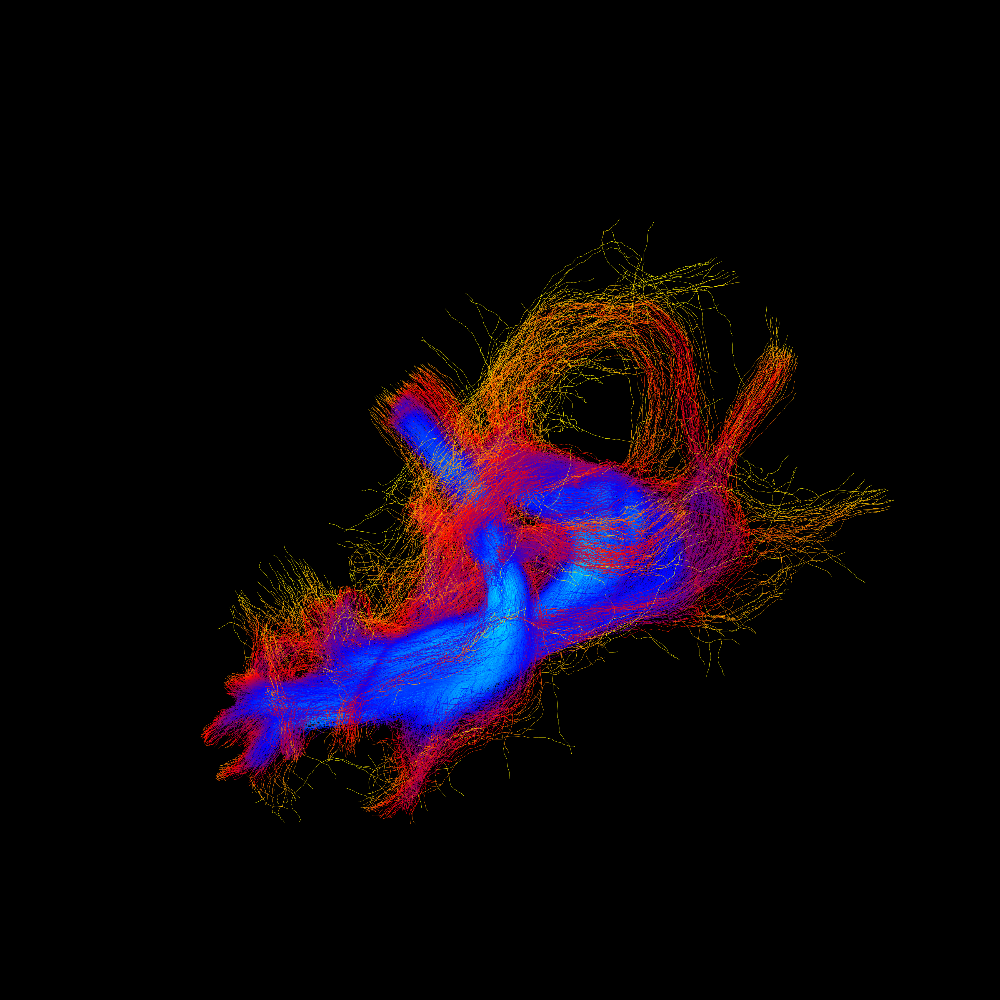

In [14]:
from IPython.display import Image
Image(filename='../images/OR_raw.png') 

### The procedure explained above has been repeated on the denoised outputs obtained from Patch2Self and Marchenk-Pastur PCA

# Effect of Patch2Self 

In [16]:
interactive = True

import numpy as np
from dipy.core.gradients import gradient_table
from dipy.data import get_fnames
from dipy.io.image import load_nifti_data, load_nifti
from dipy.io.gradients import read_bvals_bvecs

import sys
sys.path.append("..")

from model.patch2self import patch2self

# Fix seed
np.random.seed(1)

# Read data
hardi_fname, hardi_bval_fname, hardi_bvec_fname = get_fnames('stanford_hardi')
label_fname = get_fnames('stanford_labels')
t1_fname = get_fnames('stanford_t1')

data, affine = load_nifti(hardi_fname)

# denoise the data with Patch2Self
data_denoised_p2s = patch2self(data, model='ridge')
labels = load_nifti_data(label_fname)
t1_data = load_nifti_data(t1_fname)
bvals, bvecs = read_bvals_bvecs(hardi_bval_fname, hardi_bvec_fname)
gtab = gradient_table(bvals, bvecs)

# Select a relevant part of the data (left hemisphere)
# Coordinates given in x bounds, y bounds, z bounds
dshape = data_denoised_p2s.shape[:-1]
xa, xb, ya, yb, za, zb = [15, 42, 10, 65, 18, 65]
data_small = data_denoised_p2s[xa:xb, ya:yb, za:zb]
selectionmask = np.zeros(dshape, 'bool')
selectionmask[xa:xb, ya:yb, za:zb] = True

(160, 1, 652536)
Patch Extraction Done...
Training with patch-radius:  [0 0 0]
 -> Trained to Denoise Volume:  0
Denoising Volume  0  Complete...
 -> Trained to Denoise Volume:  1
Denoising Volume  1  Complete...
 -> Trained to Denoise Volume:  2
Denoising Volume  2  Complete...
 -> Trained to Denoise Volume:  3
Denoising Volume  3  Complete...
 -> Trained to Denoise Volume:  4
Denoising Volume  4  Complete...
 -> Trained to Denoise Volume:  5
Denoising Volume  5  Complete...
 -> Trained to Denoise Volume:  6
Denoising Volume  6  Complete...
 -> Trained to Denoise Volume:  7
Denoising Volume  7  Complete...
 -> Trained to Denoise Volume:  8
Denoising Volume  8  Complete...
 -> Trained to Denoise Volume:  9
Denoising Volume  9  Complete...
 -> Trained to Denoise Volume:  10
Denoising Volume  10  Complete...
 -> Trained to Denoise Volume:  11
Denoising Volume  11  Complete...
 -> Trained to Denoise Volume:  12
Denoising Volume  12  Complete...
 -> Trained to Denoise Volume:  13
Denoising

Denoising Volume  117  Complete...
 -> Trained to Denoise Volume:  118
Denoising Volume  118  Complete...
 -> Trained to Denoise Volume:  119
Denoising Volume  119  Complete...
 -> Trained to Denoise Volume:  120
Denoising Volume  120  Complete...
 -> Trained to Denoise Volume:  121
Denoising Volume  121  Complete...
 -> Trained to Denoise Volume:  122
Denoising Volume  122  Complete...
 -> Trained to Denoise Volume:  123
Denoising Volume  123  Complete...
 -> Trained to Denoise Volume:  124
Denoising Volume  124  Complete...
 -> Trained to Denoise Volume:  125
Denoising Volume  125  Complete...
 -> Trained to Denoise Volume:  126
Denoising Volume  126  Complete...
 -> Trained to Denoise Volume:  127
Denoising Volume  127  Complete...
 -> Trained to Denoise Volume:  128
Denoising Volume  128  Complete...
 -> Trained to Denoise Volume:  129
Denoising Volume  129  Complete...
 -> Trained to Denoise Volume:  130
Denoising Volume  130  Complete...
 -> Trained to Denoise Volume:  131
Denois

In [17]:
# Perform CSA
from dipy.reconst.shm import CsaOdfModel
from dipy.data import default_sphere
from dipy.direction import peaks_from_model

csa_model = CsaOdfModel(gtab, sh_order=6)
csa_peaks = peaks_from_model(csa_model, data_denoised_p2s, default_sphere,
                             relative_peak_threshold=.6,
                             min_separation_angle=45,
                             mask=selectionmask)

# Stopping Criterion
from dipy.tracking.stopping_criterion import ThresholdStoppingCriterion

stopping_criterion = ThresholdStoppingCriterion(csa_peaks.gfa, 0.25)

In [18]:
# Perform CSD on the original data
from dipy.reconst.csdeconv import auto_response
from dipy.reconst.csdeconv import ConstrainedSphericalDeconvModel

response, ratio = auto_response(gtab, data_denoised_p2s, roi_radius=10, fa_thr=0.7)
csd_model = ConstrainedSphericalDeconvModel(gtab, response)
csd_fit = csd_model.fit(data_small)
csd_fit_shm = np.lib.pad(csd_fit.shm_coeff, ((xa, dshape[0]-xb),
                                             (ya, dshape[1]-yb),
                                             (za, dshape[2]-zb),
                                             (0, 0)), 'constant')

# Probabilistic direction getting for fiber tracking
from dipy.direction import ProbabilisticDirectionGetter

prob_dg = ProbabilisticDirectionGetter.from_shcoeff(csd_fit_shm,
                                                    max_angle=30.,
                                                    sphere=default_sphere)

In [20]:
# Set a seed region region for tractography.
from dipy.tracking import utils

mask = np.zeros(data_denoised_p2s.shape[:-1], 'bool')
rad = 3
mask[26-rad:26+rad, 29-rad:29+rad, 31-rad:31+rad] = True
seeds = utils.seeds_from_mask(mask, affine, density=[6, 6, 6])

In [21]:
# Perform tracking using Local Tracking
from dipy.tracking.local_tracking import LocalTracking

streamlines_generator = LocalTracking(prob_dg, stopping_criterion, seeds,
                                      affine, step_size=.5)

# Compute streamlines.
from dipy.tracking.streamline import Streamlines
streamlines = Streamlines(streamlines_generator)

In [22]:
# Set a mask for the lateral geniculate nucleus (LGN)
mask_lgn = np.zeros(data.shape[:-1], 'bool')
rad = 5
mask_lgn[35-rad:35+rad, 42-rad:42+rad, 28-rad:28+rad] = True

# Select all the fibers that enter the LGN and discard all others
filtered_fibers2 = utils.near_roi(streamlines, affine, mask_lgn, tol=1.8)

sfil = []
for i in range(len(streamlines)):
    if filtered_fibers2[i]:
        sfil.append(streamlines[i])
streamlines = Streamlines(sfil)

In [23]:
# Compute lookup table
from dipy.denoise.enhancement_kernel import EnhancementKernel

D33 = 1.0
D44 = 0.02
t = 1
k = EnhancementKernel(D33, D44, t)

In [24]:
# Apply FBC measures
from dipy.tracking.fbcmeasures import FBCMeasures

fbc = FBCMeasures(streamlines, k)

In [25]:
# Calculate LFBC for original fibers
fbc_sl_orig, clrs_orig, rfbc_orig = \
  fbc.get_points_rfbc_thresholded(0, emphasis=0.01)

In [26]:
# Visualize the results
from dipy.viz import window, actor

# Create renderer
ren = window.Renderer()

# Original lines colored by LFBC
lineactor = actor.line(fbc_sl_orig, clrs_orig, linewidth=1.)
ren.add(lineactor)

ren.set_camera(position=(100, 100, -264),
               focal_point=(1, 1, 1),
               view_up=(1, 1, 1))
# save a PNG
window.record(ren, n_frames=1, out_path='../images/OR_p2s.png', size=(3600, 3600))

if interactive:
    window.show(ren)

C:\Users\shrey\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Renderer() deprecated, Please use Scene()instead

* deprecated from version: 0.2.0
* Will raise <class 'fury.deprecator.ExpiredDeprecationError'> as of version: 0.6.0
  """


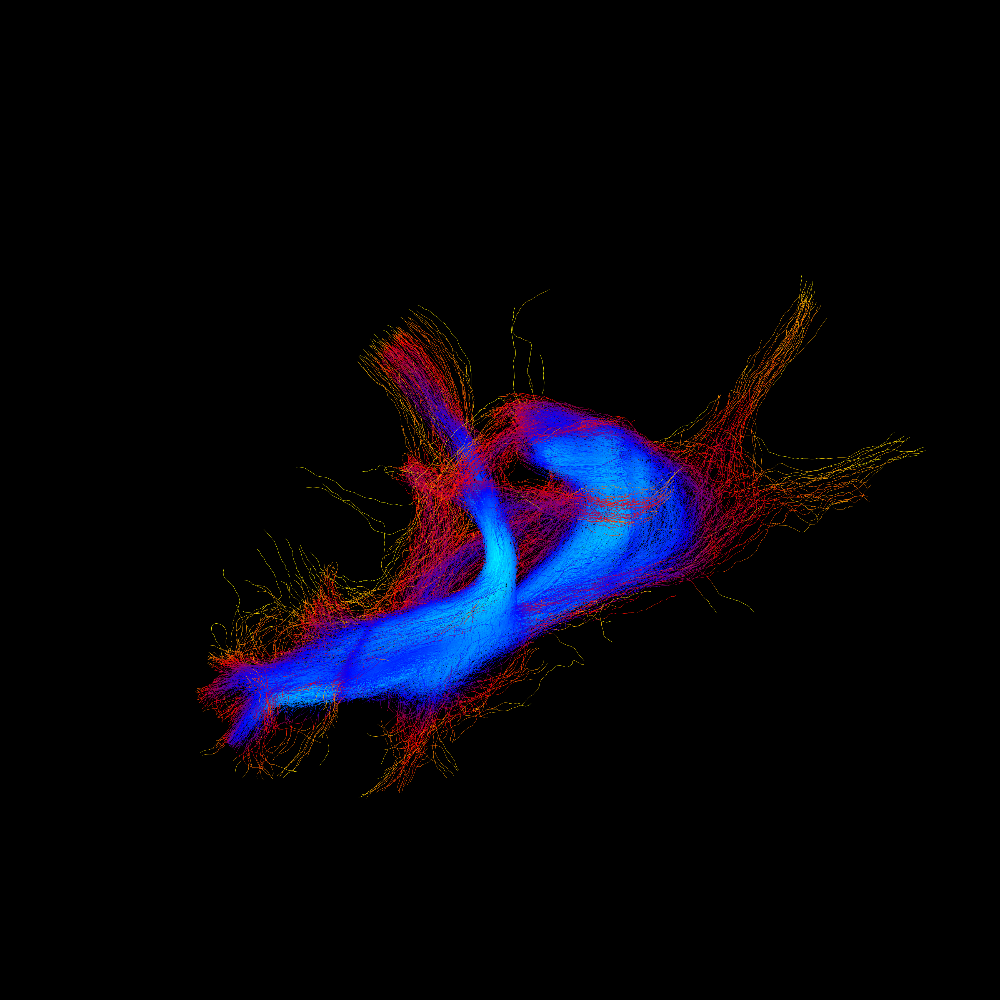

In [27]:
from IPython.display import Image
Image(filename='../images/OR_p2s.png') 

# Effect of Marchenko-Pastur PCA

In [42]:
interactive = True

import numpy as np
from dipy.core.gradients import gradient_table
from dipy.data import get_fnames
from dipy.io.image import load_nifti_data, load_nifti
from dipy.io.gradients import read_bvals_bvecs

import sys
sys.path.append("..")

from model.patch2self import patch2self

# Fix seed
np.random.seed(1)

# Read data
hardi_fname, hardi_bval_fname, hardi_bvec_fname = get_fnames('stanford_hardi')
label_fname = get_fnames('stanford_labels')
t1_fname = get_fnames('stanford_t1')

data, affine = load_nifti(hardi_fname)

# denoise the data with Marchenko-Pastur 
# This was done via the Mrtrix implememntation of the algorithm
# The output from Mrtrix has been provided in the data attached with the supplement

data_denoised_mp, _ = load_nifti('dwi_mppca.nii')
labels = load_nifti_data(label_fname)
t1_data = load_nifti_data(t1_fname)
bvals, bvecs = read_bvals_bvecs(hardi_bval_fname, hardi_bvec_fname)
gtab = gradient_table(bvals, bvecs)

# Select a relevant part of the data (left hemisphere)
# Coordinates given in x bounds, y bounds, z bounds
dshape = data_denoised_mp.shape[:-1]
xa, xb, ya, yb, za, zb = [15, 42, 10, 65, 18, 65]
data_small = data_denoised_mp[xa:xb, ya:yb, za:zb]
selectionmask = np.zeros(dshape, 'bool')
selectionmask[xa:xb, ya:yb, za:zb] = True

In [30]:
# Perform CSA
from dipy.reconst.shm import CsaOdfModel
from dipy.data import default_sphere
from dipy.direction import peaks_from_model

csa_model = CsaOdfModel(gtab, sh_order=6)
csa_peaks = peaks_from_model(csa_model, data_denoised_mp, default_sphere,
                             relative_peak_threshold=.6,
                             min_separation_angle=45,
                             mask=selectionmask)

# Stopping Criterion
from dipy.tracking.stopping_criterion import ThresholdStoppingCriterion

stopping_criterion = ThresholdStoppingCriterion(csa_peaks.gfa, 0.25)

In [31]:
# Perform CSD on the original data
from dipy.reconst.csdeconv import auto_response
from dipy.reconst.csdeconv import ConstrainedSphericalDeconvModel

response, ratio = auto_response(gtab, data_denoised_mp, roi_radius=10, fa_thr=0.7)
csd_model = ConstrainedSphericalDeconvModel(gtab, response)
csd_fit = csd_model.fit(data_small)
csd_fit_shm = np.lib.pad(csd_fit.shm_coeff, ((xa, dshape[0]-xb),
                                             (ya, dshape[1]-yb),
                                             (za, dshape[2]-zb),
                                             (0, 0)), 'constant')

# Probabilistic direction getting for fiber tracking
from dipy.direction import ProbabilisticDirectionGetter

prob_dg = ProbabilisticDirectionGetter.from_shcoeff(csd_fit_shm,
                                                    max_angle=30.,
                                                    sphere=default_sphere)

In [32]:
# Set a seed region region for tractography.
from dipy.tracking import utils

mask = np.zeros(data_denoised_mp.shape[:-1], 'bool')
rad = 3
mask[26-rad:26+rad, 29-rad:29+rad, 31-rad:31+rad] = True
seeds = utils.seeds_from_mask(mask, affine, density=[6, 6, 6])

In [33]:
# Perform tracking using Local Tracking
from dipy.tracking.local_tracking import LocalTracking

streamlines_generator = LocalTracking(prob_dg, stopping_criterion, seeds,
                                      affine, step_size=.5)

# Compute streamlines.
from dipy.tracking.streamline import Streamlines
streamlines = Streamlines(streamlines_generator)

In [34]:
# Set a mask for the lateral geniculate nucleus (LGN)
mask_lgn = np.zeros(data.shape[:-1], 'bool')
rad = 5
mask_lgn[35-rad:35+rad, 42-rad:42+rad, 28-rad:28+rad] = True

# Select all the fibers that enter the LGN and discard all others
filtered_fibers2 = utils.near_roi(streamlines, affine, mask_lgn, tol=1.8)

sfil = []
for i in range(len(streamlines)):
    if filtered_fibers2[i]:
        sfil.append(streamlines[i])
streamlines = Streamlines(sfil)

In [35]:
# Compute lookup table
from dipy.denoise.enhancement_kernel import EnhancementKernel

D33 = 1.0
D44 = 0.02
t = 1
k = EnhancementKernel(D33, D44, t)

In [36]:
# Apply FBC measures
from dipy.tracking.fbcmeasures import FBCMeasures

fbc = FBCMeasures(streamlines, k)

In [37]:
# Calculate LFBC for original fibers
fbc_sl_orig, clrs_orig, rfbc_orig = \
  fbc.get_points_rfbc_thresholded(0, emphasis=0.01)

In [38]:
# Visualize the results
from dipy.viz import window, actor

# Create renderer
ren = window.Renderer()

# Original lines colored by LFBC
lineactor = actor.line(fbc_sl_orig, clrs_orig, linewidth=1.)
ren.add(lineactor)

ren.set_camera(position=(100, 100, -264),
               focal_point=(1, 1, 1),
               view_up=(1, 1, 1))
# save a PNG
window.record(ren, n_frames=1, out_path='../images/OR_mp.png', size=(3600, 3600))

if interactive:
    window.show(ren)

C:\Users\shrey\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Renderer() deprecated, Please use Scene()instead

* deprecated from version: 0.2.0
* Will raise <class 'fury.deprecator.ExpiredDeprecationError'> as of version: 0.6.0
  """


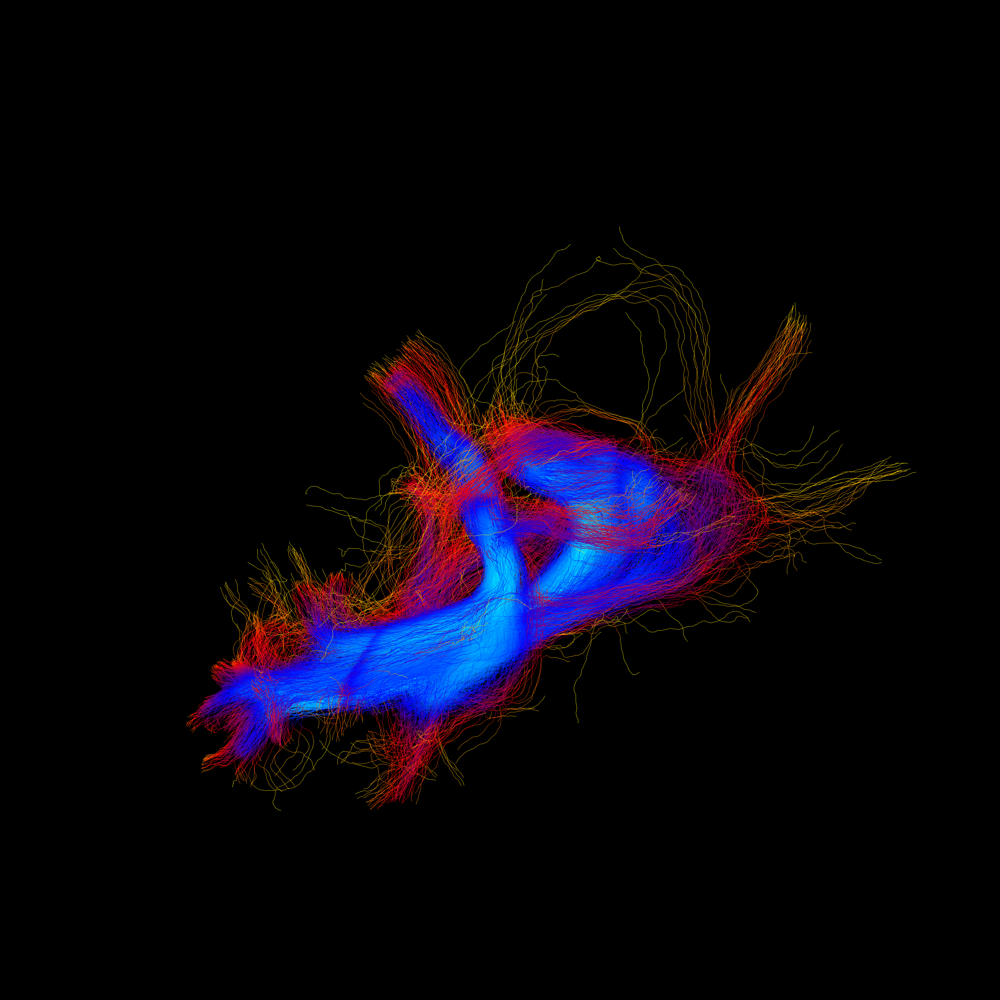

In [39]:
from IPython.display import Image
Image(filename='../images/OR_mp.png') 